# Aprendizaje Automático - Tarea 3
## Segmentación de imágenes médicas U-net y U-net++
#### Nícolas Farfán Cheneaux

In [1]:
from sklearn.model_selection import train_test_split
import segmentation_models_pytorch as smp
from torch.utils.data import DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt
import torch.optim as optim
import torch.nn as nn
from PIL import Image
import numpy as np
import torch
import time
import os

In [2]:
!nvidia-smi
torch.cuda.is_available()

Thu Aug 22 22:12:47 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 556.12                 Driver Version: 556.12         CUDA Version: 12.5     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1650      WDDM  |   00000000:01:00.0  On |                  N/A |
| N/A   48C    P0             12W /   50W |     713MiB /   4096MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

True

### Definición de hiperparámetros
Se considera un tamaño de imagen de 128x128, tamaño del batch de 32 y 25 épocas al utilizar GPU.

In [3]:
IMG_DIM = 128
TEST_SIZE = 0.2
BATCH_SIZE = 32
NUM_EPOCHS = 25

### Lectura de datos y split de train y test
Se considera el 80% para entrenamiento y 20% para prueba.
De un total de 677 imágenes se obtiene 541 imágenes para testing y 136 para prueba.

In [4]:
image_dir = os.path.join('Images/Lungs')
mask_dir = os.path.join('Masks/Lungs')

image_paths = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith('.png')]
mask_paths = [os.path.join(mask_dir, f) for f in os.listdir(mask_dir) if f.endswith('.png')]

train_image_paths, test_image_paths, train_mask_paths, test_mask_paths = train_test_split(
    image_paths, mask_paths, test_size=TEST_SIZE, random_state=42
)

transform = transforms.Compose([
    transforms.Resize((IMG_DIM, IMG_DIM)),
    transforms.ToTensor()
])

print(f"{len(train_image_paths)} Training images")
print(f"{len(test_image_paths)} Testing images")

541 Training images
136 Testing images


### Creación del DataLoader
Adaptación de las imágenes a tamaño 128x128 píxeles las de entrada a 3 canales (RGB) dado que el ENCODER **restnet4** de U-net usado trabaja con 3 canales y las máscaras a binario dado que se tiene ausencia/presencia de pulmón.

Por lo que se tiene un input_batch de las imágenes de tamaño (32, 3, 128, 128) y de las máscaras un batch de (32, 1, 128, 128).

In [5]:
def load_image(image_path, transform=None):
    image = Image.open(image_path).convert('RGB')
    if transform:
        image = transform(image)
    return image

def load_mask(mask_path, transform=None):
    mask = Image.open(mask_path).convert('1')
    if transform:
        mask = transform(mask)
    return mask

def create_dataloader(image_paths, mask_paths, transform, batch_size, shuffle=True):
    def data_generator():
        for image_path, mask_path in zip(image_paths, mask_paths):
            image = load_image(image_path, transform)
            mask = load_mask(mask_path, transform)
            yield image, mask

    dataset = list(data_generator())
    return DataLoader(dataset, batch_size, shuffle)

train_loader = create_dataloader(train_image_paths, train_mask_paths, transform, BATCH_SIZE)
test_loader = create_dataloader(test_image_paths, test_mask_paths, transform, BATCH_SIZE)

## Modelo U-net
Se considera 1 clase de salida dado que se está considerando la ausencia/presencia de pulmón.

In [6]:
model_unet = smp.Unet(
    encoder_name = 'resnet34', 
    encoder_weights = 'imagenet',
    classes = 1,
    activation = None,
)

### Optimizador Adam
Se realizador experimentos con el optimizador SGD **(revisar Anexo)** con los parámetros por defecto (momentum=0) y en el entrenamiento se obtuvo una pérdida mínima de 0.5 lo cual es muy baja en comparación al optimizador Adam donde se obtiene 0.02 de pérdida, lo mismo con el coeficiente de Dice llegando solamente a 0.2 en cambio con Adam a 0.98.

In [7]:
optimizer = optim.Adam(model_unet.parameters())

### Función de pérdida

In [8]:
criterion = nn.BCEWithLogitsLoss()

### Configuración del dispositivo CUDA
Se utiliza memoria gráfica para agilizar el entramiento y poder utilizar más épocas en este caso 25.

In [9]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

#### Se mueve el modelo al dispositivo

In [10]:
model_unet.to(device)

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track

### Coeficiente de Dice

In [11]:
def dice_coefficient(pred, target, smooth=1e-6):
    if isinstance(pred, np.ndarray):
        pred = torch.tensor(pred, dtype=torch.float32)
    if isinstance(target, np.ndarray):
        target = torch.tensor(target, dtype=torch.float32)

    pred = (pred > 0.5).float()  # Umbral para convertir la salida en binaria
    intersection = (pred * target).sum()
    dice = (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)
    return dice

### Función de entrenamiento

In [12]:
def train_model(model, train_loader, criterion, optimizer, device, num_epochs):
    train_losses = []
    dice_scores = []
    
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        dice_epoch = 0.0
        start_time = time.time()
        
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)
            
            optimizer.zero_grad()  # Reiniciar los gradientes
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)  # Acumular pérdida

            # Calcular el coeficiente de Dice en el conjunto de entrenamiento
            for i in range(outputs.size(0)):
                pred = outputs[i].detach().cpu().numpy()
                target = masks[i].detach().cpu().numpy()
                dice_epoch += dice_coefficient(pred, target)
                
        end_time = time.time()
        epoch_duration = end_time - start_time

        epoch_loss = running_loss / len(train_loader.dataset)
        train_losses.append(epoch_loss)
        
        average_dice_epoch = dice_epoch / len(train_loader.dataset)
        dice_scores.append(average_dice_epoch)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}, Dice: {average_dice_epoch:.4f}, Time: {epoch_duration:.2f} seconds')
    
    return train_losses, dice_scores

### Training

In [13]:
train_losses, dice_scores = train_model(model_unet, train_loader, criterion, optimizer, device, NUM_EPOCHS)

Epoch 1/25, Loss: 0.3527, Dice: 0.8278, Time: 5.45 seconds
Epoch 2/25, Loss: 0.1342, Dice: 0.9412, Time: 3.59 seconds
Epoch 3/25, Loss: 0.0934, Dice: 0.9498, Time: 3.63 seconds
Epoch 4/25, Loss: 0.0746, Dice: 0.9547, Time: 3.59 seconds
Epoch 5/25, Loss: 0.0641, Dice: 0.9578, Time: 3.59 seconds
Epoch 6/25, Loss: 0.0604, Dice: 0.9580, Time: 3.64 seconds
Epoch 7/25, Loss: 0.0542, Dice: 0.9610, Time: 3.60 seconds
Epoch 8/25, Loss: 0.0500, Dice: 0.9632, Time: 3.60 seconds
Epoch 9/25, Loss: 0.0499, Dice: 0.9614, Time: 3.65 seconds
Epoch 10/25, Loss: 0.0472, Dice: 0.9635, Time: 3.60 seconds
Epoch 11/25, Loss: 0.0443, Dice: 0.9659, Time: 3.65 seconds
Epoch 12/25, Loss: 0.0436, Dice: 0.9659, Time: 3.60 seconds
Epoch 13/25, Loss: 0.0414, Dice: 0.9671, Time: 3.60 seconds
Epoch 14/25, Loss: 0.0430, Dice: 0.9652, Time: 3.65 seconds
Epoch 15/25, Loss: 0.0407, Dice: 0.9678, Time: 3.60 seconds
Epoch 16/25, Loss: 0.0380, Dice: 0.9694, Time: 3.60 seconds
Epoch 17/25, Loss: 0.0386, Dice: 0.9686, Time: 3.

Se puede apreciar la rapidez de entrenamiento al utilizar CUDA dado que con CPU el entrenamiento demoraría más de 100 segundos

### Gráfico épocas vs. pérdida para la red U-net

In [14]:
def plot_epoch_loss_dice(train_losses, dice_scores, num_epochs):
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(range(1, num_epochs + 1), train_losses, label='Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Epoch vs. Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(range(1, num_epochs + 1), dice_scores, label='Dice Coefficient')
    plt.xlabel('Epochs')
    plt.ylabel('Dice Coefficient')
    plt.title('Epoch vs. Dice Coefficient')
    plt.legend()

    plt.show()

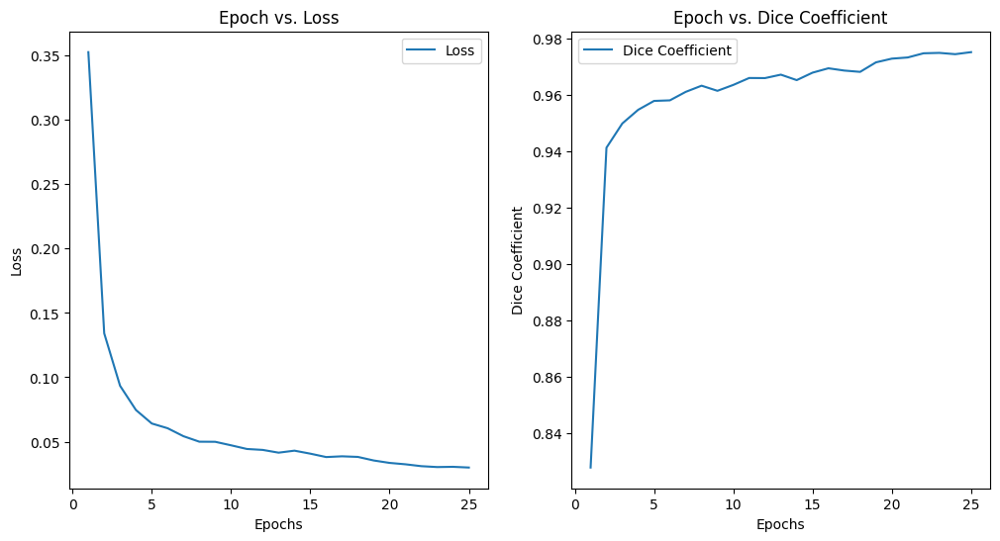

In [15]:
plot_epoch_loss_dice(train_losses, dice_scores, NUM_EPOCHS)

### Testing

In [41]:
def test_model(model, test_loader, device):
    model.eval()
    dice_scores = []
    images_to_plot = []
    predictions_to_plot = []
    masks_to_plot = []
    
    with torch.no_grad():  # Desactivar gradientes
        for images, masks in test_loader:
            images, masks = images.to(device), masks.to(device)
            predictions = model(images)

            for i in range(predictions.size(0)):
                images_to_plot.append(images[i])
                predictions_to_plot.append(predictions[i])
                masks_to_plot.append(masks[i])
                dice = dice_coefficient(predictions[i].cpu().numpy().squeeze(), masks[i].cpu().numpy().squeeze())
                dice_scores.append(dice)
    return dice_scores, images_to_plot, predictions_to_plot, masks_to_plot

In [42]:
dice_scores, images_to_plot, predictions_to_plot, masks_to_plot = test_model(model_unet, test_loader, device)

### Visualización de resultados

In [18]:
def visualize_results(images, predictions, masks, num_columns=6):
    num_images = len(images)
    num_rows = int(np.ceil(num_images / num_columns))
    
    fig, axs = plt.subplots(num_rows, num_columns, figsize=(20, num_rows * 3))
    axs = axs.ravel()

    for i in range(num_images):
        img = images[i].cpu().numpy().transpose(1, 2, 0).squeeze()
        pred = predictions[i].cpu().numpy().squeeze()
        target = masks[i].cpu().numpy().squeeze()
        
        overlay = np.zeros((img.shape[0], img.shape[1], 3))
        overlay[..., 1] = target  # Verde para la máscara real
        overlay[..., 0] = pred    # Rojo para la predicción

        overlay = np.clip(overlay, 0, 1)

        axs[i].imshow(img, cmap='gray', vmin=0, vmax=1)
        axs[i].imshow(overlay, alpha=0.5)
        axs[i].axis('off')
        axs[i].set_title(f"Dice: {dice_scores[i]:.4f}")

    for j in range(num_images, len(axs)):
        axs[j].axis('off')
    
    plt.tight_layout()
    plt.show()

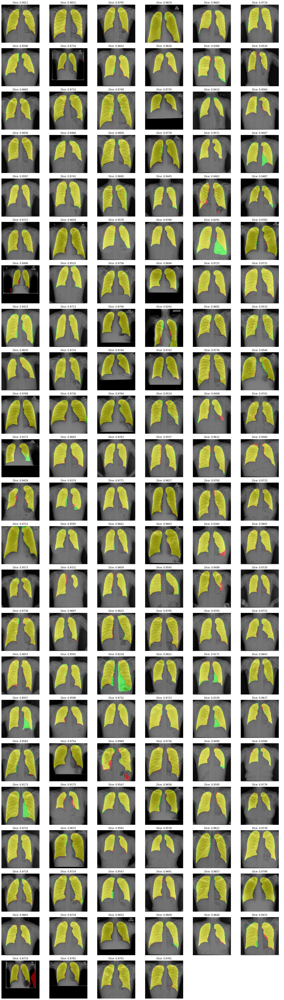

In [19]:
visualize_results(images_to_plot, predictions_to_plot, masks_to_plot)

### Selección de 5 mejores y 5 peores según el coeficiente de Dice

In [20]:
def plot_best_results(images_to_plot, predictions_to_plot, dice_scores):
    sorted_indices = np.argsort(dice_scores)
    best_indices = sorted_indices[-5:]
    visualize_results([images_to_plot[i] for i in best_indices],
                      [predictions_to_plot[i] for i in best_indices],
                      [masks_to_plot[i] for i in best_indices])
    
def plot_worst_results(images_to_plot, predictions_to_plot, dice_scores):
    sorted_indices = np.argsort(dice_scores)
    worst_indices = sorted_indices[:5]
    visualize_results([images_to_plot[i] for i in worst_indices],
                      [predictions_to_plot[i] for i in worst_indices],
                      [masks_to_plot[i] for i in worst_indices])

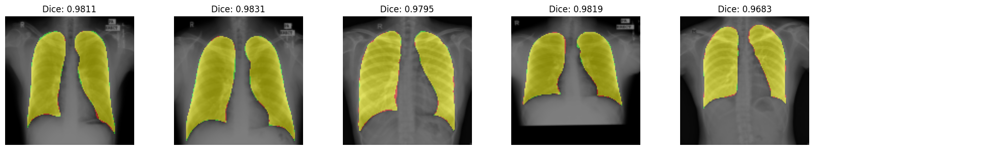

In [21]:
plot_best_results(images_to_plot, predictions_to_plot, dice_scores)

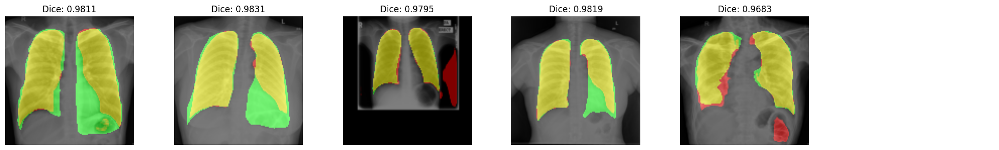

In [22]:
plot_worst_results(images_to_plot, predictions_to_plot, dice_scores)

### Gráfico de barras coeficiente. Dice

In [40]:
def plot_frequency_histogram(modelname, dice_scores, bins=10):
    plt.figure(figsize=(10, 6))
    
    # Crear el histograma
    plt.hist(dice_scores, bins=bins, color='blue', edgecolor='black')
    
    # Etiquetas y título
    plt.xlabel('Coeficiente de Dice')
    plt.ylabel('Frecuencia')
    plt.title(f'Distribución de Coeficiente de Dice para {modelname}')
    
    plt.show()

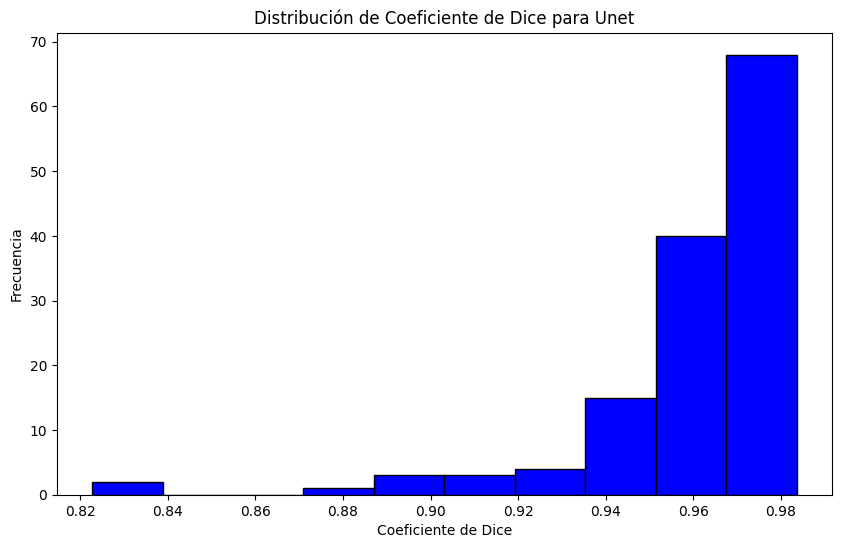

In [43]:
plot_frequency_histogram('Unet', dice_scores)

## Modelo U-net++

In [25]:
model_unetpp = smp.UnetPlusPlus(
    encoder_name = 'resnet34', 
    encoder_weights = 'imagenet',
    classes = 1,
    activation = None,
)

In [26]:
model_unetpp.to(device)

UnetPlusPlus(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=Tru

### Optimizador

In [27]:
optimizer = optim.Adam(model_unetpp.parameters())

### Training

In [28]:
train_losses, dice_scores = train_model(model_unetpp, train_loader, criterion, optimizer, device, NUM_EPOCHS)

Epoch 1/25, Loss: 0.2828, Dice: 0.8505, Time: 7.23 seconds
Epoch 2/25, Loss: 0.1074, Dice: 0.9508, Time: 7.10 seconds
Epoch 3/25, Loss: 0.0775, Dice: 0.9567, Time: 7.05 seconds
Epoch 4/25, Loss: 0.0641, Dice: 0.9598, Time: 7.10 seconds
Epoch 5/25, Loss: 0.0584, Dice: 0.9600, Time: 7.11 seconds
Epoch 6/25, Loss: 0.0525, Dice: 0.9621, Time: 7.11 seconds
Epoch 7/25, Loss: 0.0469, Dice: 0.9653, Time: 7.05 seconds
Epoch 8/25, Loss: 0.0439, Dice: 0.9667, Time: 7.11 seconds
Epoch 9/25, Loss: 0.0423, Dice: 0.9675, Time: 7.11 seconds
Epoch 10/25, Loss: 0.0387, Dice: 0.9699, Time: 7.06 seconds
Epoch 11/25, Loss: 0.0371, Dice: 0.9712, Time: 7.11 seconds
Epoch 12/25, Loss: 0.0361, Dice: 0.9714, Time: 7.11 seconds
Epoch 13/25, Loss: 0.0334, Dice: 0.9732, Time: 7.11 seconds
Epoch 14/25, Loss: 0.0308, Dice: 0.9753, Time: 7.06 seconds
Epoch 15/25, Loss: 0.0283, Dice: 0.9772, Time: 7.11 seconds
Epoch 16/25, Loss: 0.0270, Dice: 0.9779, Time: 7.12 seconds
Epoch 17/25, Loss: 0.0269, Dice: 0.9778, Time: 7.

### Gráfico épocas vs. pérdida para la red U-net++

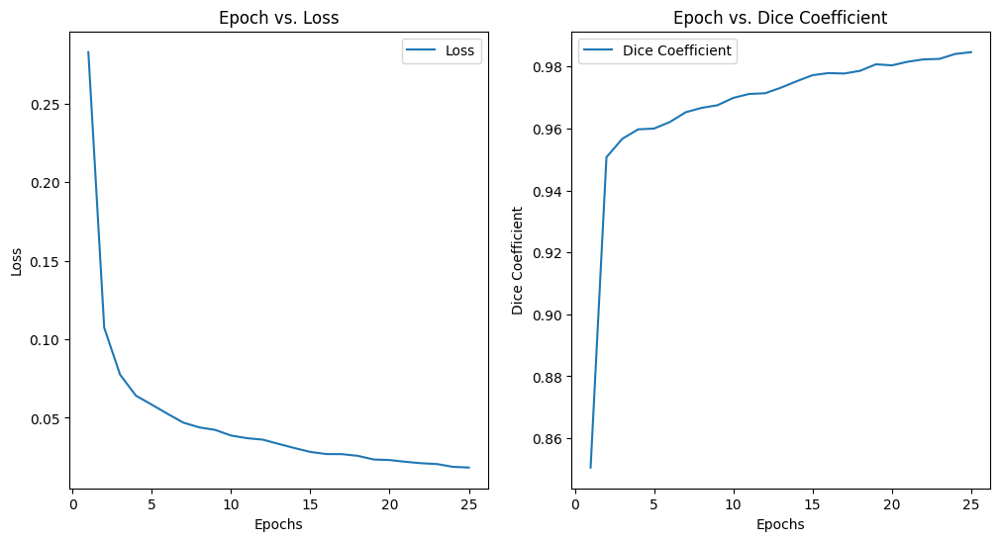

In [29]:
plot_epoch_loss_dice(train_losses, dice_scores, NUM_EPOCHS)

### Testing

In [30]:
dice_scores, images_to_plot, predictions_to_plot, masks_to_plot = test_model(model_unetpp, test_loader, device)

### Visualización de resultados

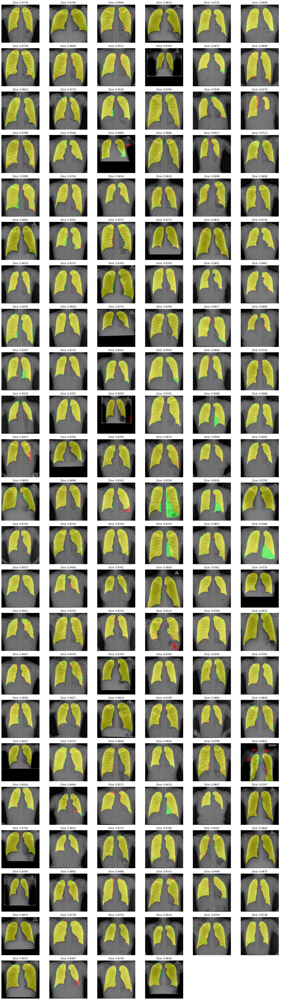

In [31]:
visualize_results(images_to_plot, predictions_to_plot, masks_to_plot)

### Selección de 5 mejores y 5 peores según el coeficiente de Dice

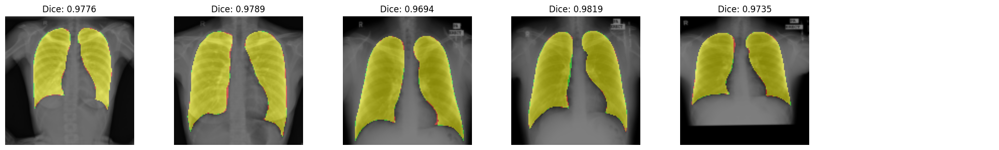

In [32]:
plot_best_results(images_to_plot, predictions_to_plot, dice_scores)

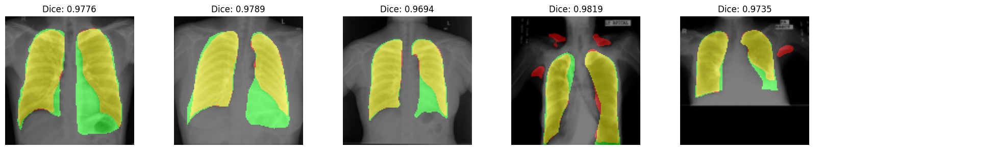

In [33]:
plot_worst_results(images_to_plot, predictions_to_plot, dice_scores)

### Gráfico de barras coeficiente. Dice

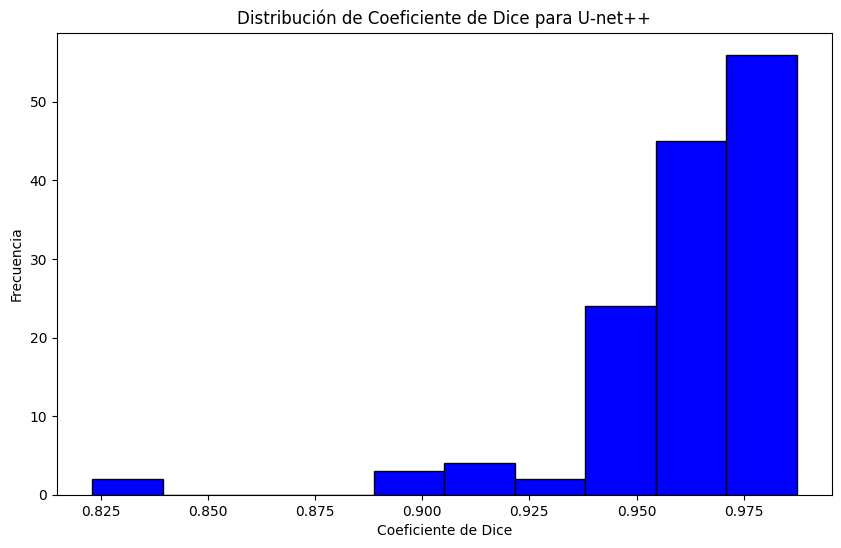

In [36]:
plot_frequency_histogram("U-net++", dice_scores)

## Anexo
### Pruebas con el Optimizador SGD

In [37]:
model2 = smp.Unet(
    encoder_name = 'resnet34', 
    encoder_weights = 'imagenet',
    classes = 1,
    activation = None,
).to(device)

optimizer = optim.SGD(model2.parameters())

train_losses, dice_scores = train_model(model2, train_loader, criterion, optimizer, device, NUM_EPOCHS)

Epoch 1/25, Loss: 0.7155, Dice: 0.2164, Time: 3.45 seconds
Epoch 2/25, Loss: 0.6843, Dice: 0.2183, Time: 3.40 seconds
Epoch 3/25, Loss: 0.6577, Dice: 0.2215, Time: 3.43 seconds
Epoch 4/25, Loss: 0.6324, Dice: 0.2268, Time: 3.44 seconds
Epoch 5/25, Loss: 0.6126, Dice: 0.2249, Time: 3.45 seconds
Epoch 6/25, Loss: 0.5950, Dice: 0.2188, Time: 3.41 seconds
Epoch 7/25, Loss: 0.5785, Dice: 0.2206, Time: 3.44 seconds
Epoch 8/25, Loss: 0.5640, Dice: 0.2184, Time: 3.44 seconds
Epoch 9/25, Loss: 0.5501, Dice: 0.2180, Time: 3.45 seconds
Epoch 10/25, Loss: 0.5382, Dice: 0.2198, Time: 3.45 seconds
Epoch 11/25, Loss: 0.5263, Dice: 0.2210, Time: 3.44 seconds
Epoch 12/25, Loss: 0.5147, Dice: 0.2256, Time: 3.46 seconds
Epoch 13/25, Loss: 0.5037, Dice: 0.2342, Time: 3.45 seconds
Epoch 14/25, Loss: 0.4945, Dice: 0.2413, Time: 3.46 seconds
Epoch 15/25, Loss: 0.4839, Dice: 0.2495, Time: 3.46 seconds
Epoch 16/25, Loss: 0.4751, Dice: 0.2587, Time: 3.42 seconds
Epoch 17/25, Loss: 0.4652, Dice: 0.2725, Time: 3.

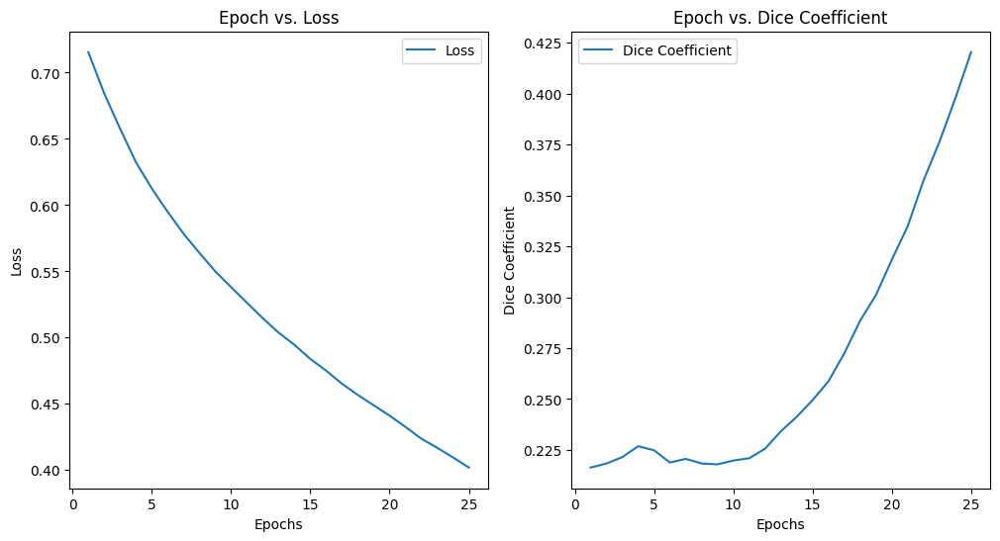

In [38]:
plot_epoch_loss_dice(train_losses, dice_scores, NUM_EPOCHS)